In [ ]:
!unzip "drive/MyDrive/Dog Face/dog-breed-identification.zip" -d "drive/MyDrive/Dog Face/unziped1"

Streaming output truncated to the last 5000 lines.
  inflating: drive/MyDrive/Dog Face/unziped1/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: drive/MyDrive/Dog Face/unziped1/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: drive/MyDrive/Dog Face/unziped1/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: drive/MyDrive/Dog Face/unziped1/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: drive/MyDrive/Dog Face/unziped1/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: drive/MyDrive/Dog Face/unziped1/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: drive/MyDrive/Dog Face/unziped1/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: drive/MyDrive/Dog Face/unziped1/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: drive/MyDrive/Dog Face/unziped1/train/83fad0718581a696132c96c166472627.jpg  
  inflating: drive/MyDrive/Dog Face/unziped1/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: drive/MyDrive/Dog Face/unziped1/trai

In [81]:
import tensorflow as tf

In [82]:
print("TF Version :", tf.__version__)

TF Version : 2.15.0


In [83]:
import tensorflow_hub as hub

In [84]:
print("Hub Version : ", hub.__version__)

Hub Version :  0.16.1


In [85]:
print("GPU Available" if tf.config.list_physical_devices("GPU") else "GPU Not Available")

GPU Not Available


In [86]:
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [87]:
import pandas as pd
label_csv = pd.read_csv("/content/drive/MyDrive/Dog Face/unziped1/labels.csv")
label_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [88]:
label_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


<Axes: >

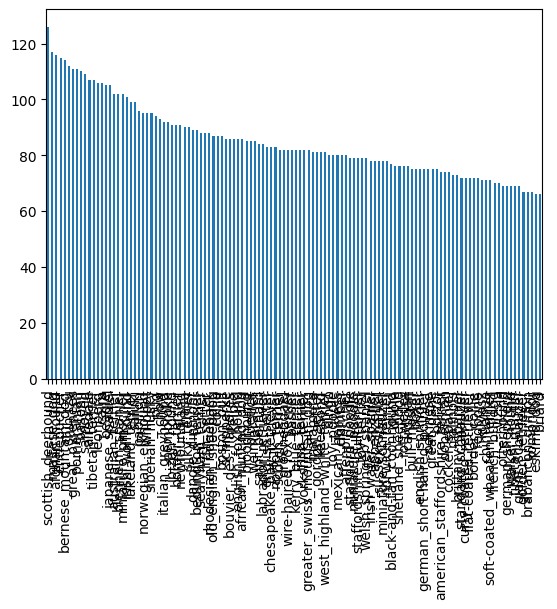

In [89]:
label_csv["breed"].value_counts().plot.bar()

In [90]:
from IPython.display import display, Image
filenames = ["/content/drive/MyDrive/Dog Face/unziped1/train/"+filename +".jpg" for filename in label_csv["id"]]
len(filenames)


10222

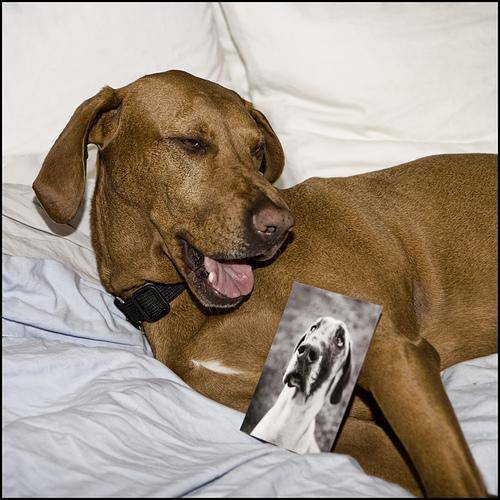

In [91]:
Image(filenames[100])

In [92]:
import os
if len(os.listdir("drive/MyDrive/Dog Face/unziped1/train")) == len(filenames):
  print("same length")
else:
  print("Not same length")

same length


In [93]:
import numpy as np

labels = label_csv["breed"].to_numpy()
len(labels)

10222

In [94]:
len(labels), len(filenames)

(10222, 10222)

In [95]:
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [96]:
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [97]:
boolean_labels = [label == np.array(unique_breeds) for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [98]:
print(boolean_labels[0].astype(int))

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [99]:
X = filenames
y = boolean_labels

In [100]:
NUM_IMAGES = 1000

In [101]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [102]:
X_train[:2], y_train[:2]

(['/content/drive/MyDrive/Dog Face/unziped1/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Dog Face/unziped1/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False,

In [103]:
from matplotlib.pyplot import imread
image1 = imread(filenames[10])
image1.shape

(500, 375, 3)

In [104]:
IMG_SIZE = 224

def process_image(image_path):
  image = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image, channels=3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize(image, size=(IMG_SIZE,IMG_SIZE))
  return image


In [105]:
def get_image_label(image_path, label):
  return process_image(image_path), label

In [106]:
BATCH_SIZE = 32

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, test_data=False, valid_data=False):
  if test_data:
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  elif valid_data:
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data = data.shuffle(buffer_size = len(X))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch



In [107]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)


In [108]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [109]:

import matplotlib.pyplot as plt

def show_25_images(images, labels):
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax = plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")


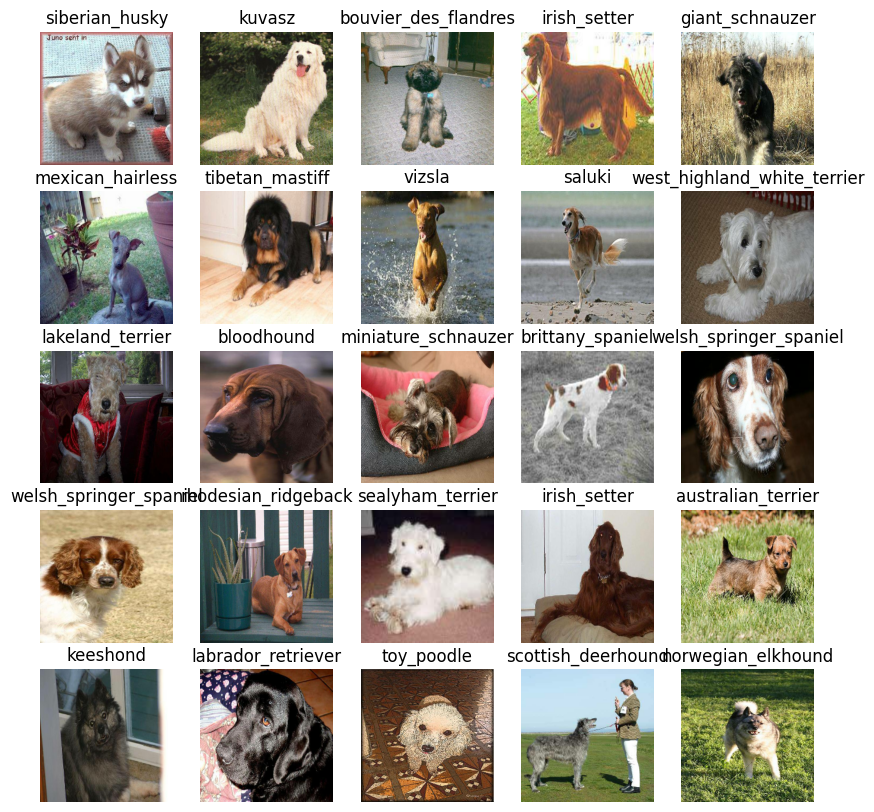

In [110]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

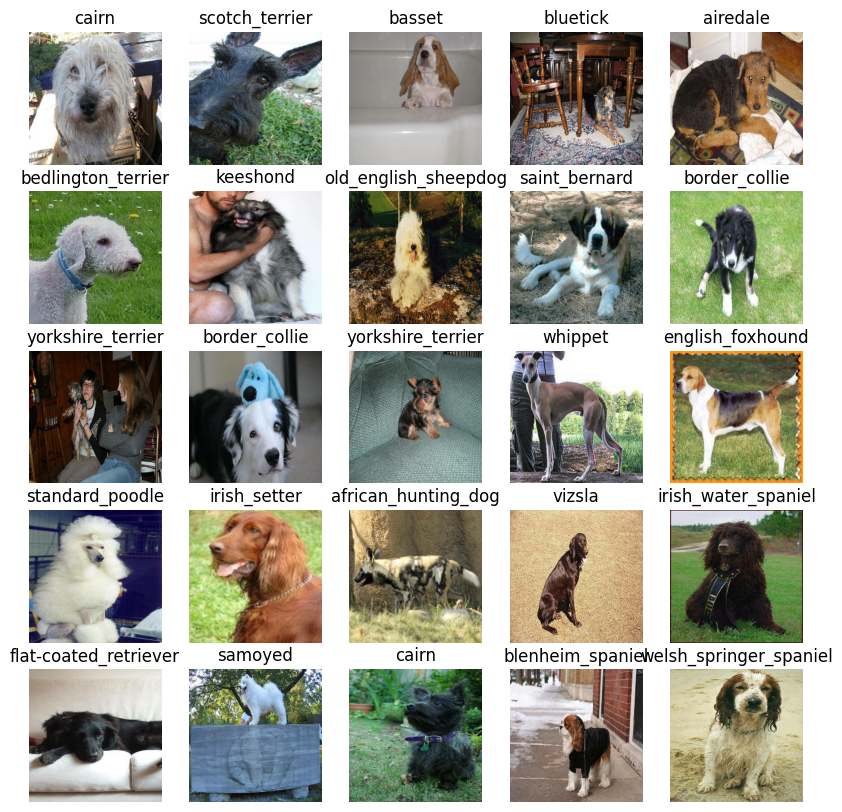

In [111]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

In [112]:
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]
OUTPUT_SHAPE = len(unique_breeds)
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [113]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  model = tf.keras.Sequential([hub.KerasLayer(MODEL_URL),
                               tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax")])

  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  model.build(INPUT_SHAPE)

  return model

In [114]:
model = create_model()
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_3 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_3 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [115]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [116]:
import datetime
def create_tensorboard_callback():
  logdir = os.path.join("drive/MyDrive/Dog\ Face/log",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [117]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

In [118]:
NUM_EPOCHS = 100

In [119]:
def train_model():
  model = create_model()
  tensorboard= create_tensorboard_callback()

  model.fit(x=train_data,
            epochs =NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model

In [120]:
model = train_model()

Epoch 1/100
25/25 [==============================] - 72s 3s/step - loss: 4.6409 - accuracy: 0.0750 - val_loss: 3.4867 - val_accuracy: 0.2500
Epoch 2/100
25/25 [==============================] - 100s 4s/step - loss: 1.6533 - accuracy: 0.6775 - val_loss: 2.2468 - val_accuracy: 0.4850
Epoch 3/100
25/25 [==============================] - 63s 3s/step - loss: 0.5602 - accuracy: 0.9375 - val_loss: 1.7847 - val_accuracy: 0.6100
Epoch 4/100
25/25 [==============================] - 65s 3s/step - loss: 0.2477 - accuracy: 0.9887 - val_loss: 1.5482 - val_accuracy: 0.6350
Epoch 5/100
25/25 [==============================] - 55s 2s/step - loss: 0.1438 - accuracy: 0.9987 - val_loss: 1.4647 - val_accuracy: 0.7000
Epoch 6/100
25/25 [==============================] - 56s 2s/step - loss: 0.0993 - accuracy: 1.0000 - val_loss: 1.4243 - val_accuracy: 0.6900
Epoch 7/100
25/25 [==============================] - 52s 2s/step - loss: 0.0740 - accuracy: 1.0000 - val_loss: 1.3978 - val_accuracy: 0.6750
Epoch 8/100


In [121]:
%tensorboard --logdir drive/MyDrive/Dog\ Face/log

<IPython.core.display.Javascript object>

In [122]:
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 40s 3s/step


array([[3.6890429e-04, 1.3491655e-04, 1.9873015e-03, ..., 6.6208927e-04,
        4.0605544e-05, 1.1653575e-02],
       [4.1855602e-03, 4.5856481e-04, 8.0951173e-03, ..., 9.7613374e-04,
        2.1209253e-03, 2.8390101e-05],
       [4.1988300e-05, 2.2428972e-04, 2.0846572e-04, ..., 1.0046931e-03,
        1.0273780e-05, 3.3068823e-04],
       ...,
       [4.5759407e-06, 5.9547096e-05, 2.7016364e-04, ..., 6.6062530e-05,
        2.9281696e-04, 1.3692364e-04],
       [2.0603077e-03, 5.5234786e-04, 3.3275675e-04, ..., 5.9799757e-04,
        1.1763216e-04, 1.0936171e-02],
       [9.5228676e-04, 2.4962743e-05, 3.5897428e-03, ..., 1.0080163e-03,
        1.3352708e-03, 7.5659096e-05]], dtype=float32)

In [123]:
predictions.shape

(200, 120)

In [124]:
print(np.max(predictions[0]))
print(np.sum(predictions[0]))
print(np.argmax(predictions[0]))
print(unique_breeds[np.argmax(predictions[0])])

0.27089736
1.0
26
cairn


In [125]:
def get_pred_label(pred_poss):
  return unique_breeds[np.argmax(pred_poss)]

pred_label = get_pred_label(predictions[0])
pred_label

'cairn'

In [126]:
def unbatchify_data(data):
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

val_images, val_labels = unbatchify_data(val_data)
val_images[0], val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [131]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  pred_label = get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color="green"
  else:
    color="red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                     np.max(pred_prob)*100,
                                     true_label), color=color)

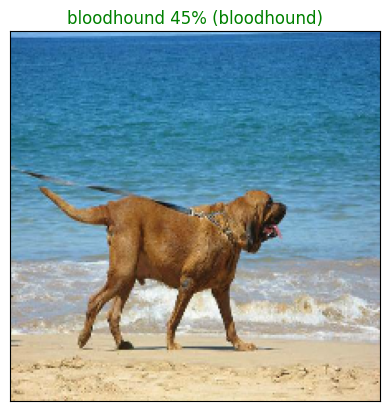

In [134]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=100)

In [135]:
def plot_pred_conf(prediction_possibilities, labels, n=1):
  pred_prob, true_label = prediction_possibilities[n], labels[n]

  pred_label = get_pred_label(pred_prob)

  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")

  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

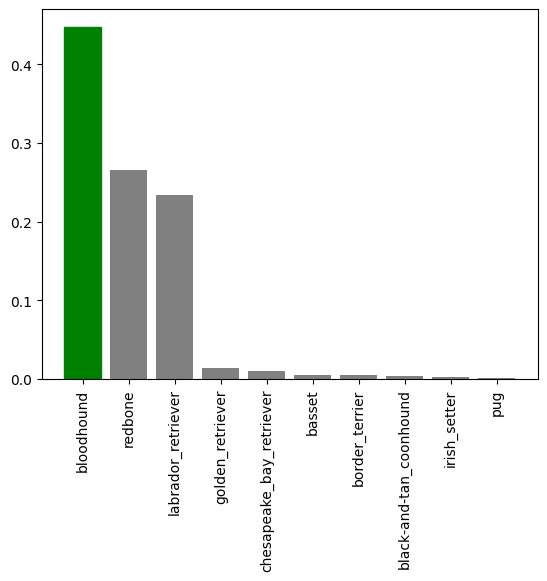

In [136]:
plot_pred_conf(prediction_possibilities=predictions, labels=val_labels, n=100)

<function matplotlib.pyplot.show(close=None, block=None)>

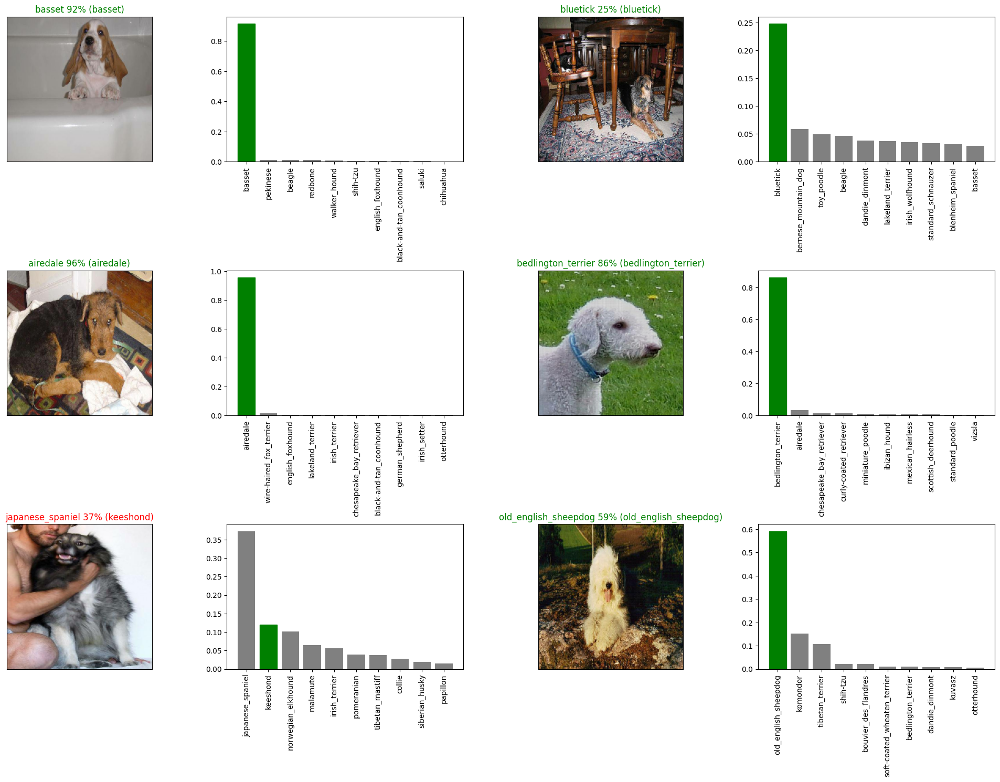

In [144]:
i_multiplier = 2
rows=3
columns=2
num_images=rows*columns
plt.figure(figsize=(10*columns, 5*rows))

for i in range(num_images):
  plt.subplot(rows, 2*columns, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(rows, 2*columns, 2*i+2)
  plot_pred_conf(prediction_possibilities=predictions,
            labels=val_labels,
            n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show

In [145]:
def save_model(model, suffix=None):
  modeldir = os.path.join("drive/MyDrive/Dog Face/unziped1/models/", datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))

  model_path = modeldir + "-" + suffix + ".h5"
  model.save(model_path)
  return model_path

In [146]:
def load_model(model_path):
  model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [147]:
save_model(model, suffix="1000_images")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Face/unziped1/models/20240217-06171708150652-1000_images.h5'

In [148]:
model_1000_images = load_model("drive/MyDrive/Dog Face/unziped1/models/20240217-06171708150652-1000_images.h5")

In [149]:
model.evaluate(val_data)

7/7 [==============================] - 18s 2s/step - loss: 1.3731 - accuracy: 0.6750


[1.373091459274292, 0.675000011920929]

In [150]:
model_1000_images.evaluate(val_data)

7/7 [==============================] - 12s 1s/step - loss: 1.3731 - accuracy: 0.6750


[1.373091459274292, 0.675000011920929]

In [151]:
len(X), len(y)

(10222, 10222)

In [152]:
full_data = create_data_batches(X,y)

In [153]:
full_model = create_model()

In [154]:
full_model_tensorboard = create_tensorboard_callback()

full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

In [156]:
%tensorboard --logdir drive/MyDrive/Dog Face/unziped1/logs

ERROR: Failed to launch TensorBoard (exited with 2).
Contents of stderr:
2024-02-17 06:26:53.723385: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-17 06:26:53.723470: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-17 06:26:53.724831: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-02-17 06:26:57.059962: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
usage: tensorboard [-h] [--helpfull] [--logdir PATH] [--logdir_spec PATH_SPEC] [--host ADDR]
                   [--bind_all] [--port PORT] [--reuse_port BOOL] [--load_f

In [157]:
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 647s 2s/step - loss: 1.3490 - accuracy: 0.6639
Epoch 2/100
320/320 [==============================] - 654s 2s/step - loss: 0.4010 - accuracy: 0.8786
Epoch 3/100
320/320 [==============================] - 552s 2s/step - loss: 0.2368 - accuracy: 0.9352
Epoch 4/100
320/320 [==============================] - 541s 2s/step - loss: 0.1544 - accuracy: 0.9616
Epoch 5/100
320/320 [==============================] - 551s 2s/step - loss: 0.1073 - accuracy: 0.9779
Epoch 6/100
320/320 [==============================] - 538s 2s/step - loss: 0.0775 - accuracy: 0.9869
Epoch 7/100
320/320 [==============================] - 536s 2s/step - loss: 0.0580 - accuracy: 0.9922
Epoch 8/100
320/320 [==============================] - 535s 2s/step - loss: 0.0453 - accuracy: 0.9953
Epoch 9/100
320/320 [==============================] - 537s 2s/step - loss: 0.0385 - accuracy: 0.9956
Epoch 10/100
320/320 [==============================] - 531s 2s/step - loss: 0.031

In [158]:
save_model(full_model, suffix="full_data")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Face/unziped1/models/20240217-09191708161586-full_data.h5'

In [159]:
test_path = "drive/MyDrive/Dog Face/unziped1/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

test_filenames[:10]

['drive/MyDrive/Dog Face/unziped1/test/dfe02d52ca281aaca6215a42fee6245c.jpg',
 'drive/MyDrive/Dog Face/unziped1/test/deec27ba9446dfe31c0b32586f175d6a.jpg',
 'drive/MyDrive/Dog Face/unziped1/test/e64b15ca154304104fe95ded7338858e.jpg',
 'drive/MyDrive/Dog Face/unziped1/test/def88eeacc633cbc3d46d5f5fb495379.jpg',
 'drive/MyDrive/Dog Face/unziped1/test/e381c5fcf1420985b20117e4bc7d38cd.jpg',
 'drive/MyDrive/Dog Face/unziped1/test/dfc41d3f135d49a41e7b796883ff030e.jpg',
 'drive/MyDrive/Dog Face/unziped1/test/e0f9b92adbba451d296678f466732969.jpg',
 'drive/MyDrive/Dog Face/unziped1/test/e2166bdff9e35f80aa7984ec64c8cce8.jpg',
 'drive/MyDrive/Dog Face/unziped1/test/e1b9b0a95a4c7a3c4f3a3a8622314d37.jpg',
 'drive/MyDrive/Dog Face/unziped1/test/e3dd8fc9162f726122ca4cc783114c81.jpg']

In [160]:
len(test_filenames)

10357

In [161]:
test_predictions = full_model.predict(full_data, verbose =1)

320/320 [==============================] - 559s 2s/step


In [162]:
custom_path = "drive/MyDrive/Dog Face/unziped1/custom_images/"
custom_image_path = [custom_path + fname for fname in os.listdir(custom_path)]
custom_data = create_data_batches(custom_image_path, test_data=True)
custom_preds = full_model.predict(custom_data)
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

1/1 [==============================] - 2s 2s/step


['eskimo_dog', 'maltese_dog', 'miniature_poodle']

In [163]:
custom_images = []
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

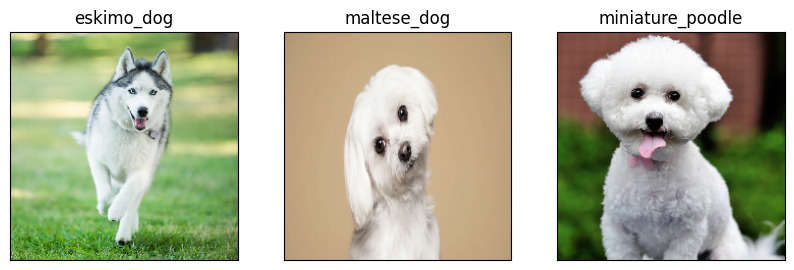

In [166]:
  plt.figure(figsize=(10,10))
  for i, image in enumerate(custom_images):
    plt.subplot(1,3,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.title(custom_pred_labels[i])
    plt.imshow(image)